In [1]:
# Proprietary libraries
import aux_document_retrieval_bm25 as aux_bm25 #located in 4_semantic_search, move over or copy
import aux_document_retrieval_vsm as aux_vsm #located in 4_semantic_search, move over or copy
import aux_semantic_search as aux_semantics #located in 4_semantic_search, move over or copy
import dataclass as data #located in 4_semantic_search, move over or copy
import aux_retrieval_evaluation as aux_retrieval

from typing import  Dict, Any, Union
from pathlib import Path
import nltk
import importlib
import pickle
import yaml

# Reload Modules
importlib.reload(aux_vsm)
importlib.reload(aux_bm25)
importlib.reload(aux_semantics)
importlib.reload(aux_retrieval)

# For word processing
nltk.download('punkt_tab')

DocLike = Union[data.RetrievedDocument, Dict[str, Any]]

2025-06-13 12:41:25,581 - numexpr.utils - INFO - NumExpr defaulting to 8 threads.
[nltk_data] Downloading package punkt_tab to /home/pablo/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [5]:
with open("config_eval.yml", "r") as f:
    config = yaml.safe_load(f)

# Convert paths to Path objects
paths = {k: Path(v) for k, v in config["paths"].items()}

# Other parameters
save_file = Path(config["save_file"])
use_multivector = config["use_multivector"]
use_expansion = config["use_expansion"]
norm_vsm = config["norm_vsm"]
norm_bm25 = config["norm_bm25"]
top_k = config["top_k"]

with open(str(paths["single_eval"]), 'rb') as f:
    dfs = pickle.load(f)

hybrid_df = dfs['hybrid_statistics']
rrf_df    = dfs['rrf_statistics']
bm25_df   = dfs['bm25_statistics']
vsm_df    = dfs['vsm_statistics']
rerank_df = dfs['rerank_statistics']

df_list = [
    ('Hybrid', hybrid_df),
    ('RRF',    rrf_df),
    ('BM25',   bm25_df),
    ('VSM',    vsm_df),
    ('ReRank', rerank_df)
]
df_dict = dict(df_list)

with open(str(paths["multi_eval"]), 'rb') as f:
    dfs = pickle.load(f)

hybrid_df = dfs['hybrid_statistics']
rrf_df    = dfs['rrf_statistics']
bm25_df   = dfs['bm25_statistics']
vsm_df    = dfs['vsm_statistics']
rerank_df = dfs['rerank_statistics']

df_list_2 = [
    ('Hybrid', hybrid_df),
    ('RRF',    rrf_df),
    ('BM25',   bm25_df),
    ('VSM',    vsm_df),
    ('ReRank', rerank_df)
]

df_dict_2 = dict(df_list_2)

In [9]:
with open('../02-data/06-Evaluation/norm_eval.pkl', 'rb') as f:
    dfs = pickle.load(f)

minmax_zs = dfs['minmax/zs']
minmax_minmax    = dfs['minmax/minmax']
zs_zs   = dfs['zs/zs']
zs_minmax = dfs['zs/minmax']

df_list_2 = [
    ('minmax_zs', minmax_zs),
    ('minmax_minmax',   minmax_minmax),
    ('zs_zs',   zs_zs),
    ('zs_minmax',    zs_minmax),
]

df_dict_2 = dict(df_list_2)

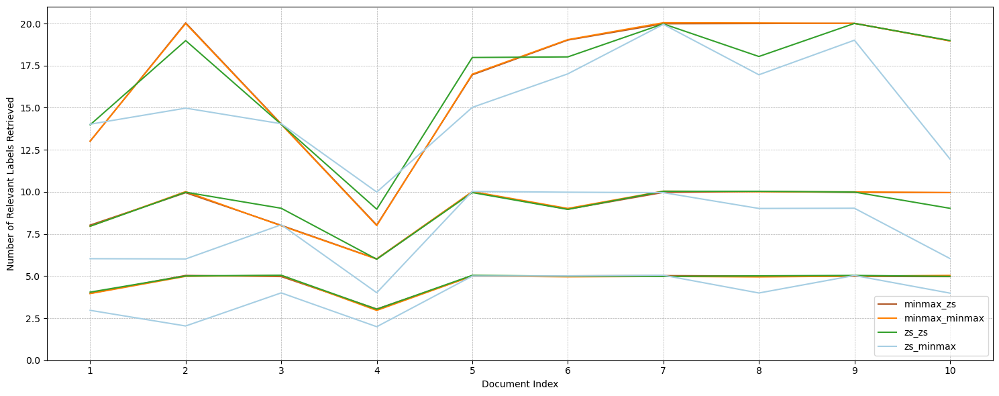

{'minmax_zs': {5: 5.0, 10: 10.0, 20: 19.0},
 'minmax_minmax': {5: 5.0, 10: 10.0, 20: 19.0},
 'zs_zs': {5: 5.0, 10: 9.5, 20: 18.0},
 'zs_minmax': {5: 4.0, 10: 8.5, 20: 15.0}}

In [31]:
importlib.reload(aux_retrieval)
aux_retrieval.plot_recall_at_k_all_systems(df_dict_2, figsize=(15,6),cmap='Paired_r')

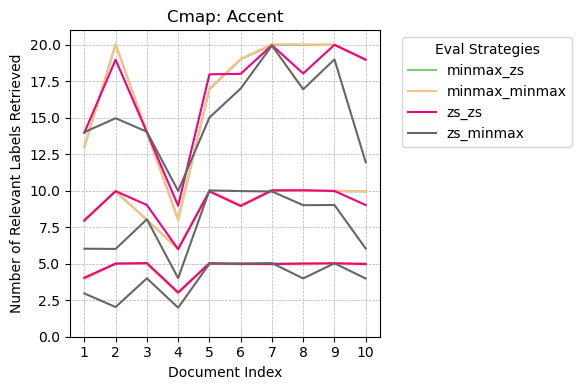

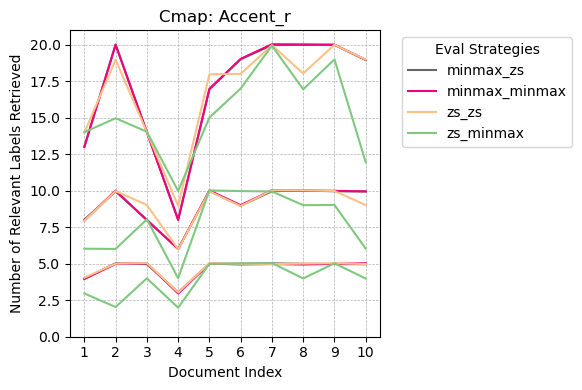

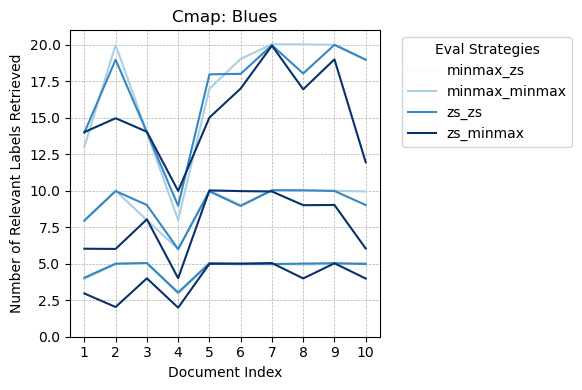

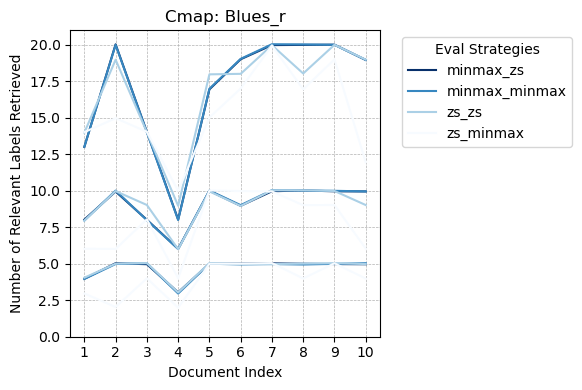

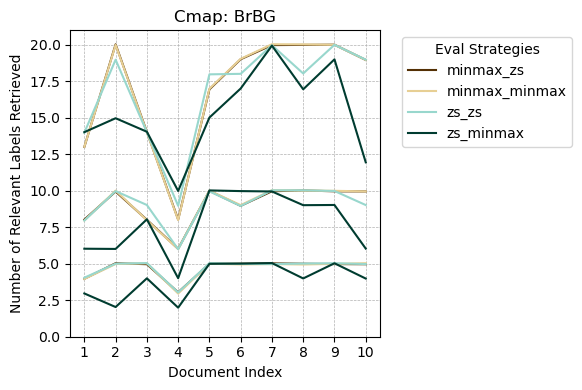

...

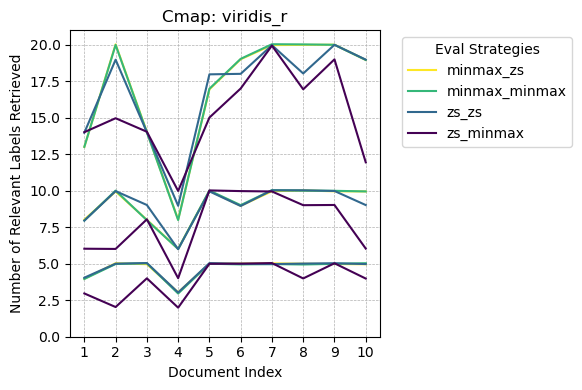

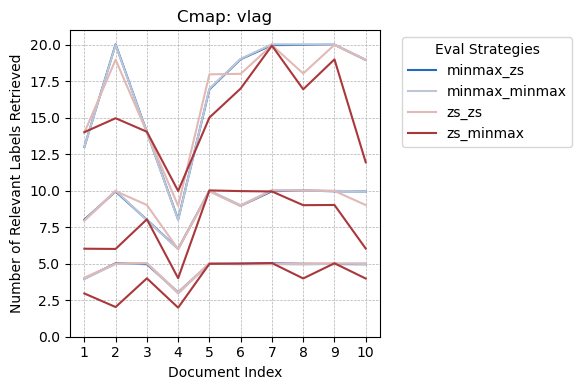

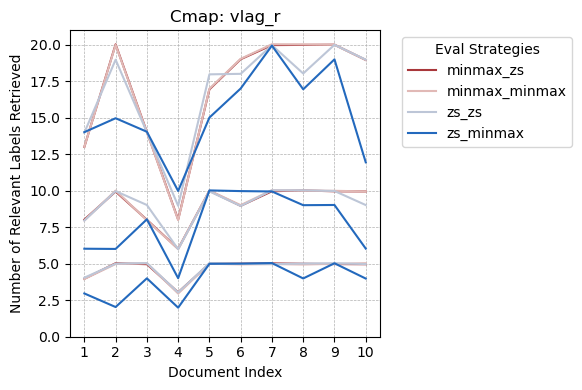

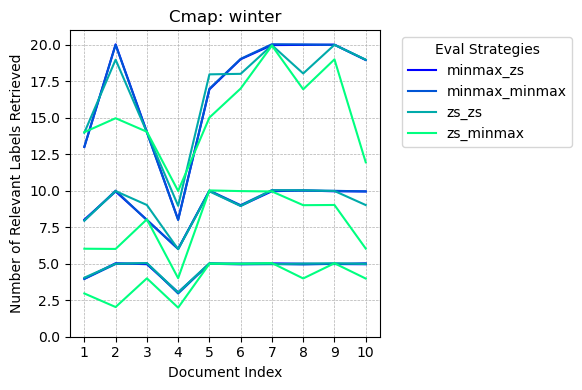

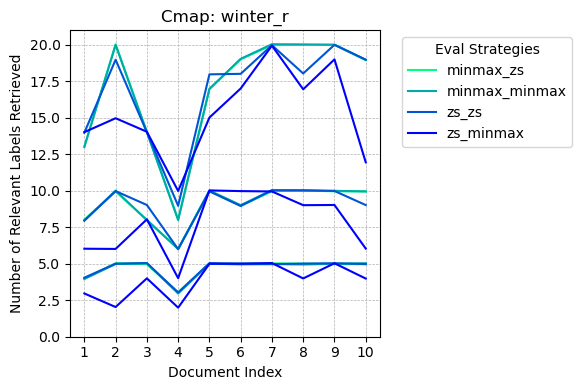

In [25]:
importlib.reload(aux_retrieval)
medians_by_cmap = aux_retrieval.compare_cmaps(
    df_dict_2,
    ks=[5,10,20],
    cmap_list=['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Grays', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_grey', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gist_yerg', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'grey', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r']
)

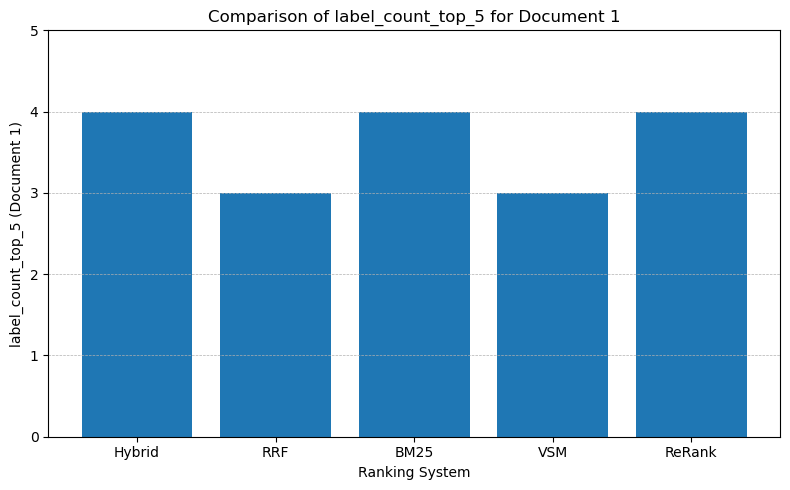

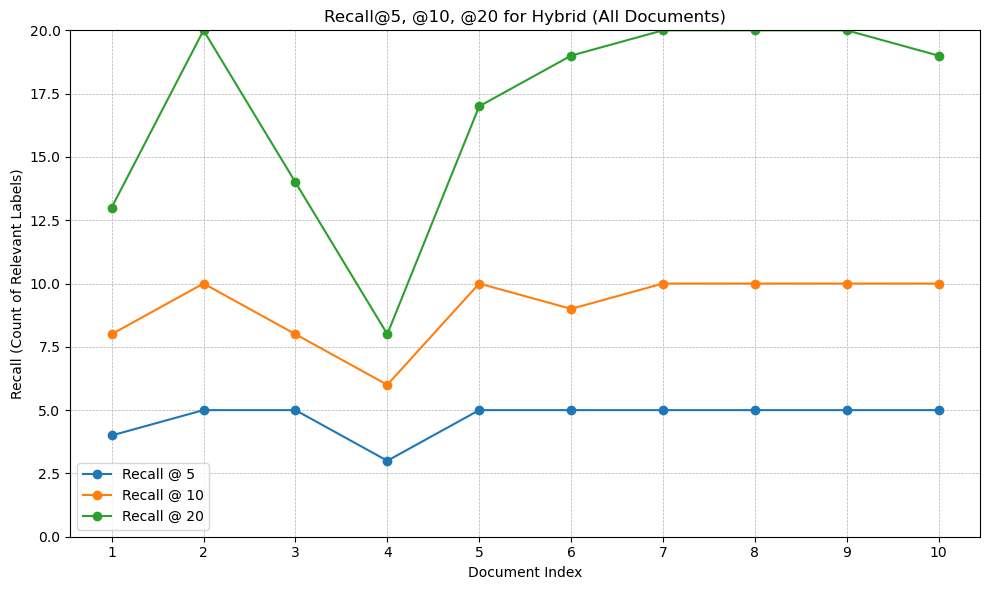

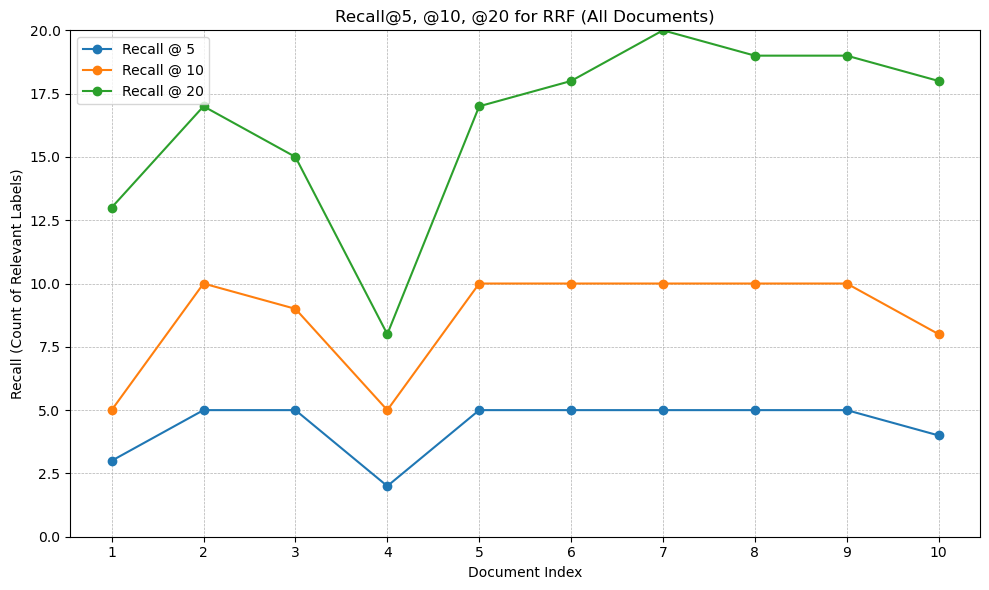

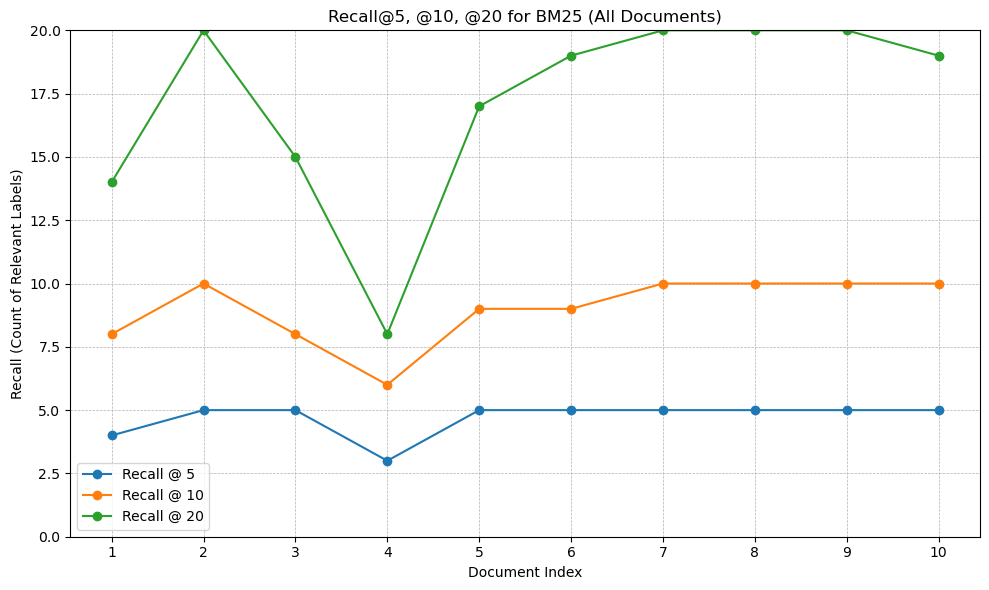

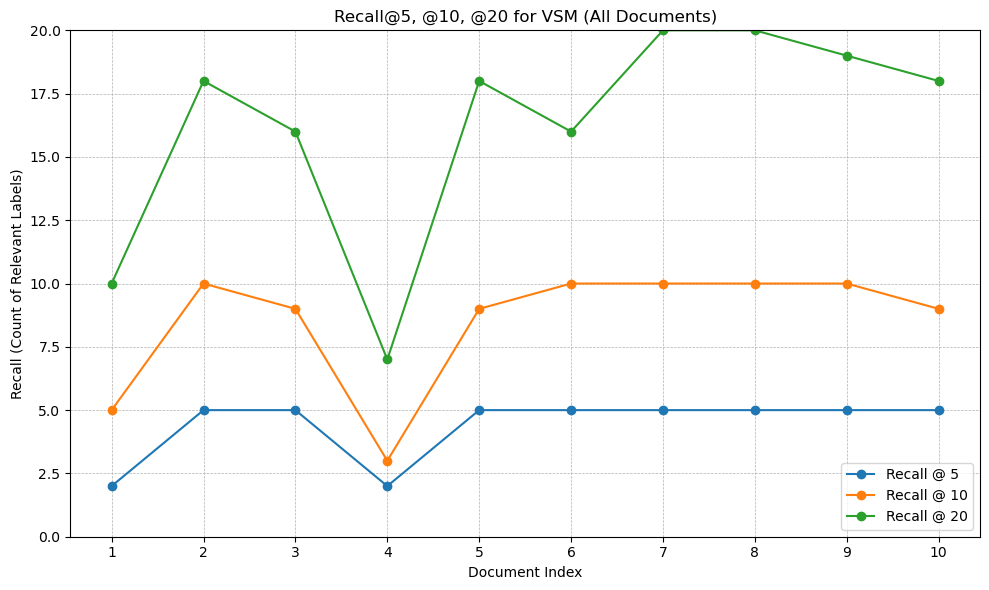

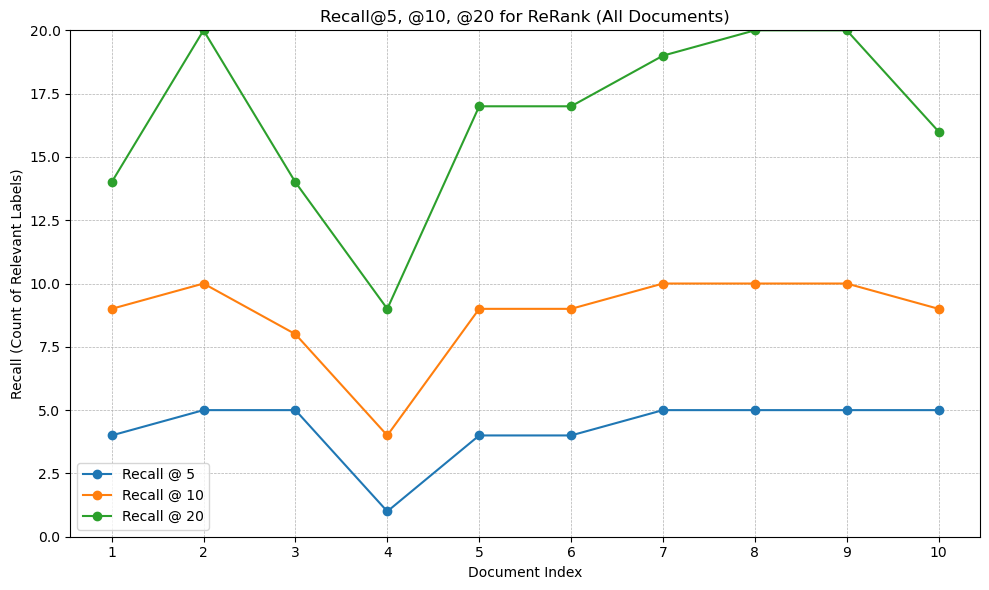

In [40]:
import pickle
import matplotlib.pyplot as plt


# 2) PLOT label_count_top_5 FOR DOCUMENT 1 ACROSS RANKING SYSTEMS
# --------------------------------------------------------------
# We treat “Document 1” as row index 0 in each DataFrame.
doc_index = 0
names     = []
top5_vals = []

for name, df in df_list_2:
    # extract label_count_top_5 for the first row (index=0)
    val = df.iloc[doc_index]['label_count_top_5']
    names.append(name)
    top5_vals.append(val)

plt.figure(figsize=(8, 5))
plt.bar(names, top5_vals)
plt.xlabel('Ranking System')
plt.ylabel('label_count_top_5 (Document 1)')
plt.title('Comparison of label_count_top_5 for Document 1')
plt.ylim(0, 5)
plt.grid(axis='y', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


# 4) EXAMPLE USAGE: CALL THE FUNCTION FOR EACH RANKING SYSTEM
# -----------------------------------------------------------
aux_retrieval.plot_recall_for_documents(hybrid_df, 'Hybrid')
aux_retrieval.plot_recall_for_documents(rrf_df, 'RRF')
aux_retrieval.plot_recall_for_documents(bm25_df, 'BM25')
aux_retrieval.plot_recall_for_documents(vsm_df, 'VSM')
aux_retrieval.plot_recall_for_documents(rerank_df, 'ReRank')


--------------------

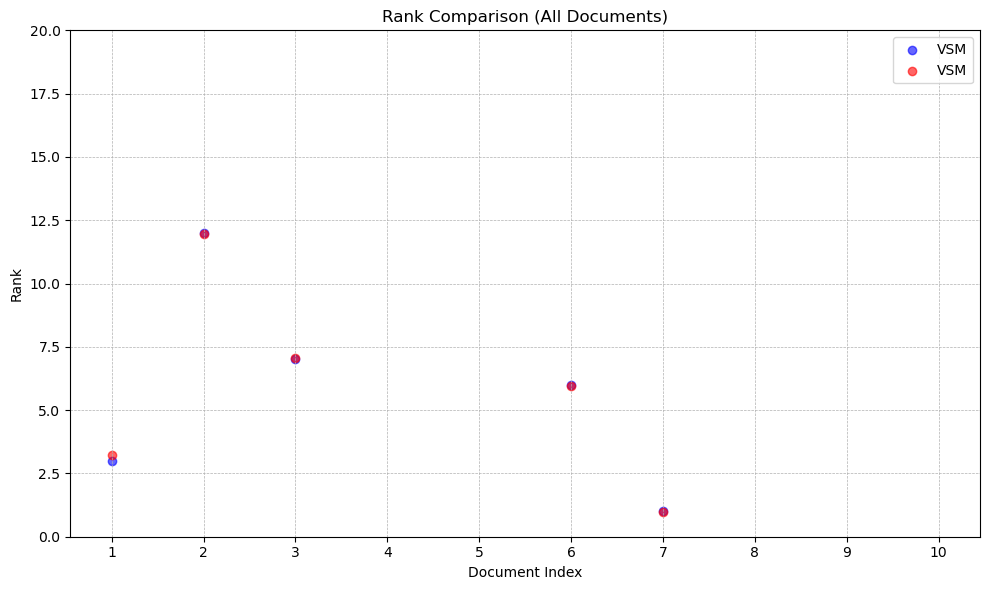

In [39]:
vsm_df = df_dict['RRF']
vsm_df_2 = df_dict['RRF']

aux_retrieval.plot_rank_comparison(vsm_df, vsm_df_2, "VSM", "VSM")

--------------------

In [1]:
# 4) EXAMPLE USAGE:
#    This will plot the "recall@5" (label_count_top_5) lines for all five methods together.
aux_retrieval.plot_combined_recall(df_list, 'label_count_top_5')

# If you want to compare recall@10 for all methods, call:
aux_retrieval.plot_combined_recall(df_list, 'label_count_top_10')

# Or for recall@20:
aux_retrieval.plot_combined_recall(df_list, 'label_count_top_20')

NameError: name 'aux_retrieval' is not defined

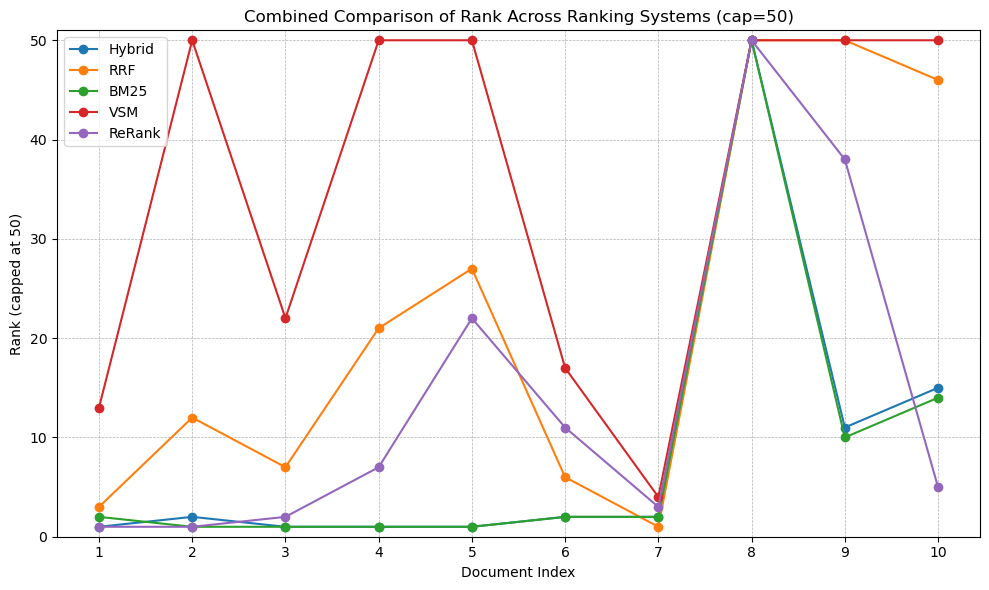

In [9]:
aux_retrieval.plot_combined_rank(df_list)

In [36]:
importlib.reload(aux_retrieval)

<module 'aux_retrieval_evaluation' from '/media/pablo/windows_files/00 - Master/05 - Research&Thesis/R2-Research_Internship_2/01-code/aux_retrieval_evaluation.py'>

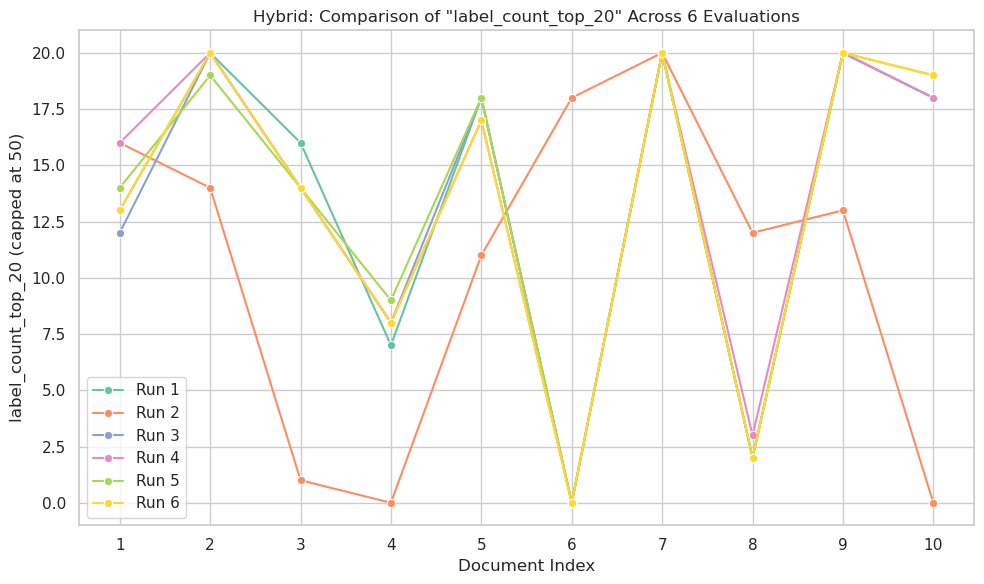

In [37]:
 rqe_list = aux_retrieval.load_rqe_runs(1, 6)
 labels = [f'Run {i}' for i in range(1, 7)]
 
aux_retrieval.plot_hybrid_across_evaluations_sns(
    rqe_list,
    metric_col='label_count_top_20',
    labels=labels,
    cap=50
)